<a href="https://colab.research.google.com/github/Naditya206/PCVK/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [25]:
from google.colab import drive

drive.mount ('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah tingkat kecerahan citra 
-------------------------------
Masukkan nilai kecerahan: 50


/tmp/ipython-input-855597496.py:19: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)


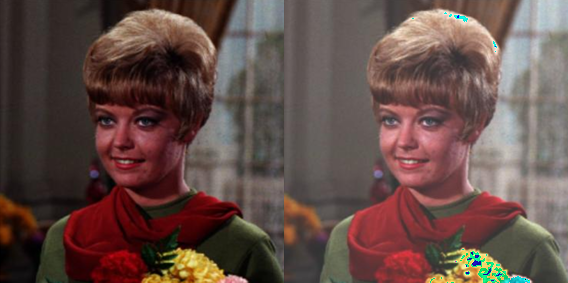

In [46]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra ')
print('-------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/girl.png')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y, x, c] = np.clip(original[y, x, c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat([original, brightness_image])
cv2_imshow(final_frame)

**TUGAS PRAKTIKUM D1 **

1.  Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang
terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

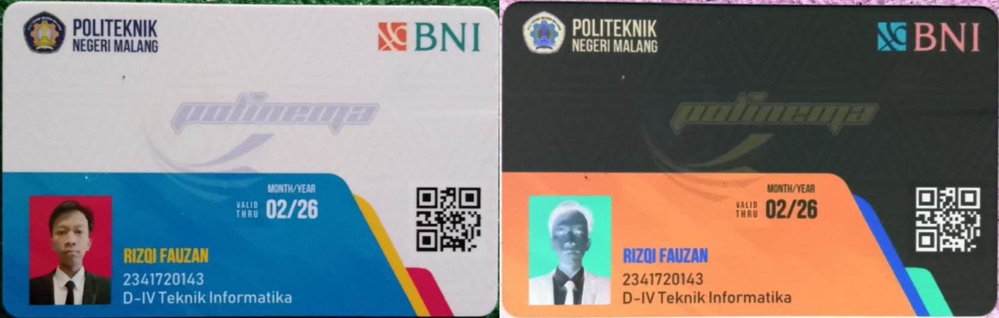

In [27]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# Membaca citra asli
original = cv.imread('/content/drive/MyDrive/PCVK/ktm.jpg')

# Inverse citra (negatif)
inverse_image = 255 - original

# Gabungkan citra asli dan hasil inverse untuk ditampilkan berdampingan
final_frame = cv.hconcat([original, inverse_image])

# Tampilkan hasil
cv2_imshow(final_frame)
cv.waitKey(0)
cv.destroyAllWindows()


2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

 Mengubah kontras dan tingkat kecerahan citra 
------------------------------------------------
Masukkan tingkat kecerahan [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0]: 2


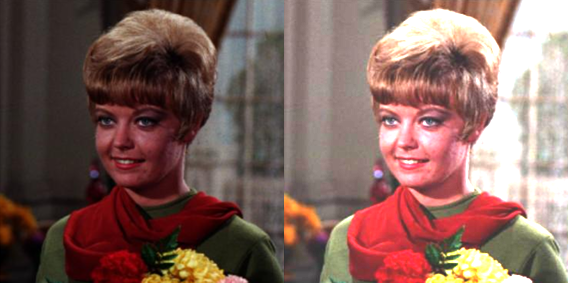

In [47]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(" Mengubah kontras dan tingkat kecerahan citra ")
print("------------------------------------------------")

# Input kecerahan dan kontras
brightness = int(input("Masukkan tingkat kecerahan [-255 - 255]: "))
contrast = float(input("Masukkan kontras [1.0 - 3.0]: "))

# Membaca gambar
original = cv.imread('/content/drive/MyDrive/PCVK/girl.png')

# Transformasi kontras dan kecerahan
adjusted = cv.convertScaleAbs(original, alpha=contrast, beta=brightness)

# Gabungkan gambar asli dan hasil transformasi
final_frame = cv.hconcat([original, adjusted])

# Tampilkan hasil
cv2_imshow(final_frame)
cv.waitKey(0)
cv.destroyAllWindows()


3.  Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 50


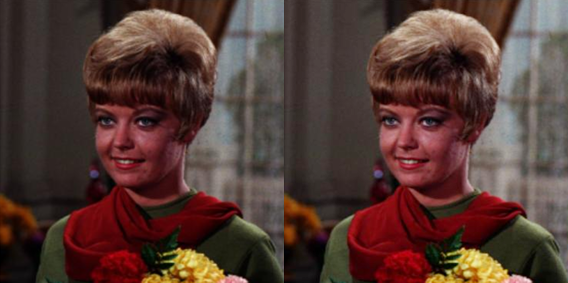

In [48]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print("Mengubah tingkat kecerahan citra dengan Transformasi Log")
print("--------------------------------------------------------")

# Input nilai kecerahan
brightness = int(input("Masukkan nilai kecerahan: "))

# Membaca gambar (tetap dalam format BGR)
original = cv.imread('/content/drive/MyDrive/PCVK/girl.png')

# Normalisasi nilai piksel ke [0,1]
normalized = original / 255.0

# Konstanta c (bisa diatur dengan brightness)
c = 1 + (brightness / 100)

# Transformasi log
log_image = c * np.log1p(normalized)

# Normalisasi ulang ke [0,255]
# Penting: Pastikan citra memiliki tipe data float sebelum normalisasi
log_image = 255 * (log_image / np.max(log_image))
log_image = np.uint8(log_image)

# Gabungkan hasil (tidak perlu konversi warna lagi)
final_frame = cv.hconcat([original, log_image])

# Tampilkan hasil
cv2_imshow(final_frame)
cv.waitKey(0)
cv.destroyAllWindows()

4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

Implementasi transformasi grayscale dengan metode averaging, lightness, dan luminance
----------------------------------------------------------------------------------
Averaging Method:


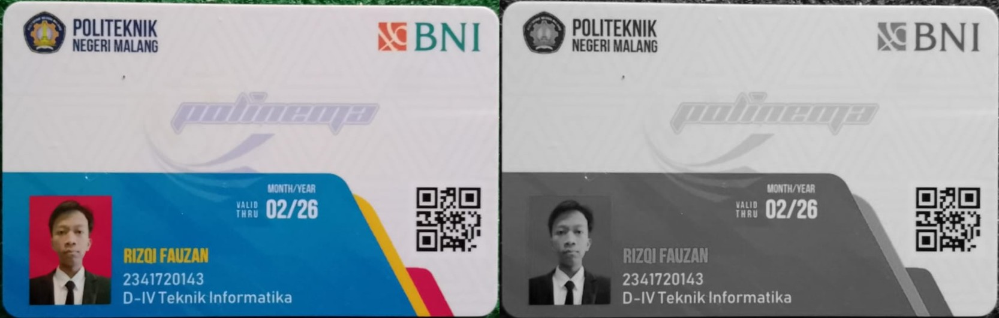


Lightness Method:


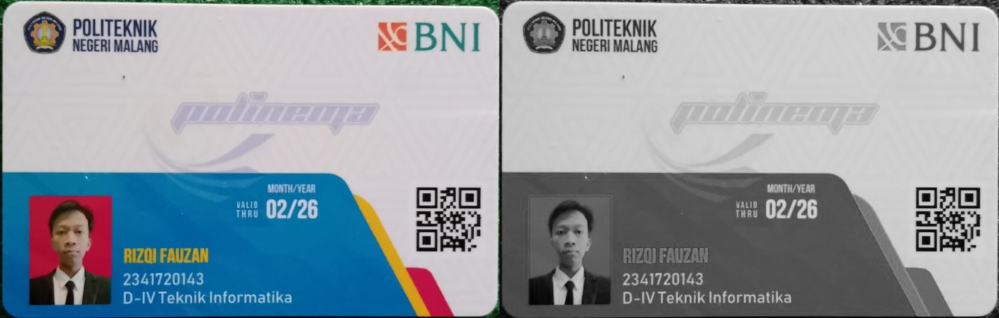


Luminance Method:


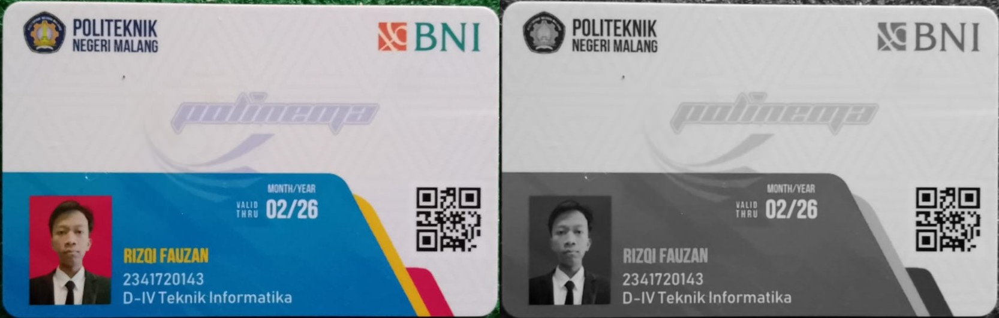

In [30]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print("Implementasi transformasi grayscale dengan metode averaging, lightness, dan luminance")
print("----------------------------------------------------------------------------------")

# Membaca gambar (secara default dalam format BGR)
original = cv.imread('/content/drive/MyDrive/PCVK/ktm.jpg')

# Periksa apakah gambar berhasil dimuat
if original is None:
    print("Error: Tidak dapat memuat gambar. Pastikan path file benar.")
else:
    # Mengambil kanal BGR dari gambar
    b, g, r = cv.split(original)

    # Grayscale Averaging
    # Formula: (R + G + B) / 3
    grayscale_avg = (r.astype(np.float64) + g.astype(np.float64) + b.astype(np.float64)) / 3
    grayscale_avg = np.uint8(grayscale_avg)

    # Grayscale Lightness
    # Formula: (max(R, G, B) + min(R, G, B)) / 2
    max_val = np.maximum.reduce([r, g, b])
    min_val = np.minimum.reduce([r, g, b])
    grayscale_lightness = (max_val.astype(np.float64) + min_val.astype(np.float64)) / 2
    grayscale_lightness = np.uint8(grayscale_lightness)

    # Grayscale Luminance
    # Formula: 0.21 * R + 0.72 * G + 0.07 * B
    grayscale_luminance = 0.21 * r.astype(np.float64) + 0.72 * g.astype(np.float64) + 0.07 * b.astype(np.float64)
    grayscale_luminance = np.uint8(grayscale_luminance)

    # Menggabungkan gambar asli dan hasil transformasi
    # Menggunakan cv.hconcat untuk menggabungkan gambar secara horizontal
    # Mengubah gambar grayscale menjadi 3 kanal untuk tampilan yang konsisten jika perlu
    # Namun, cv2_imshow bisa menampilkan gambar 1 kanal dengan baik
    final_frame_avg = cv.hconcat([original, cv.cvtColor(grayscale_avg, cv.COLOR_GRAY2BGR)])
    final_frame_lightness = cv.hconcat([original, cv.cvtColor(grayscale_lightness, cv.COLOR_GRAY2BGR)])
    final_frame_luminance = cv.hconcat([original, cv.cvtColor(grayscale_luminance, cv.COLOR_GRAY2BGR)])

    # Menampilkan hasil
    print("Averaging Method:")
    cv2_imshow(final_frame_avg)
    print("\nLightness Method:")
    cv2_imshow(final_frame_lightness)
    print("\nLuminance Method:")
    cv2_imshow(final_frame_luminance)

    cv.waitKey(0)
    cv.destroyAllWindows()

5.  Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,
tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna
biru menjadi grayscale seperti pada contoh berikut:

Menampilkan warna tertentu (biru) dan mengubah warna lain menjadi grayscale
-------------------------------------------------------------------------


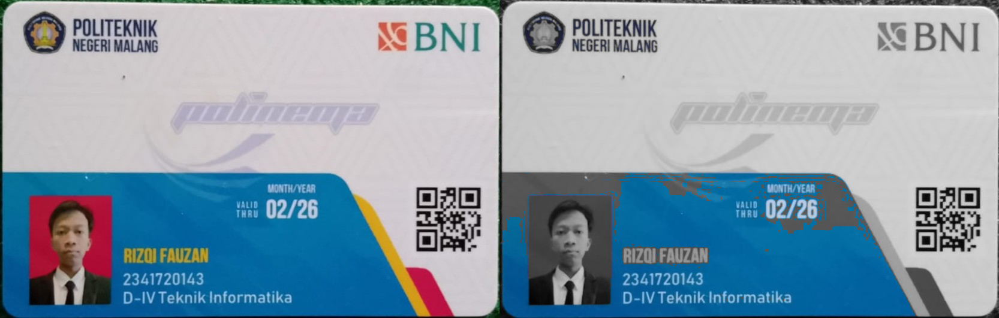

In [31]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print("Menampilkan warna tertentu (biru) dan mengubah warna lain menjadi grayscale")
print("-------------------------------------------------------------------------")

# Membaca gambar
original = cv.imread('/content/drive/MyDrive/PCVK/ktm.jpg')

if original is None:
    print("Error: Gambar tidak ditemukan atau path salah.")
else:
    # Mengambil dimensi gambar
    rows, cols, _ = original.shape

    # Mengubah gambar ke format HSV untuk segmentasi warna yang lebih baik
    hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

    # Menentukan rentang warna biru dalam HSV
    # Rentang ini bisa disesuaikan tergantung nuansa warna birunya
    lower_blue = np.array([100, 50, 50])
    upper_blue = np.array([130, 255, 255])

    # Membuat mask untuk warna biru
    mask_blue = cv.inRange(hsv, lower_blue, upper_blue)

    # Membuat gambar grayscale dari gambar asli
    gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
    # Mengubah gambar grayscale menjadi 3 kanal agar bisa digabungkan dengan gambar berwarna
    gray_3_channel = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

    # Menggabungkan gambar berwarna dan grayscale
    # Bagian berwarna (biru) diambil dari gambar asli
    # Bagian lain diambil dari gambar grayscale
    output = np.zeros_like(original)

    for i in range(rows):
        for j in range(cols):
            # Jika piksel berada dalam rentang biru (mask_blue > 0)
            if mask_blue[i, j] > 0:
                output[i, j] = original[i, j]
            # Jika tidak, gunakan piksel grayscale
            else:
                output[i, j] = gray_3_channel[i, j]

    # Menggabungkan gambar asli dan gambar hasil
    final_frame = cv.hconcat([original, output])

    # Menampilkan hasil
    cv2_imshow(final_frame)
    cv.waitKey(0)
    cv.destroyAllWindows()

**D2. Operasi Aritmatika dan Logika**

 1. Buat Gamma Correction sesuai dengan petunjuk berikut

Gamma Correction pada citra
----------------------------
Masukkan nilai Gamma: 3


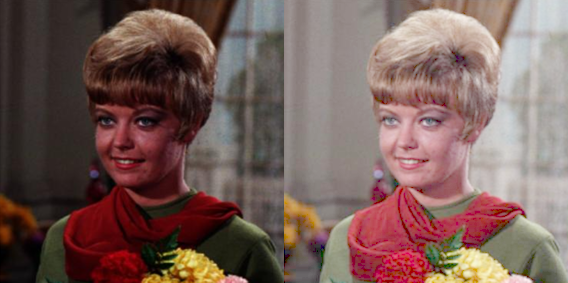

In [32]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Gamma Correction pada citra')
print('----------------------------')

# Path gambar yang akan diproses
image_path = '/content/drive/MyDrive/PCVK/girl.png'

try:
    # Meminta input nilai gamma dari pengguna
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
else:
    # Membaca gambar
    original = cv.imread(image_path)
    if original is None:
        print(f"Error: Gambar tidak ditemukan di path '{image_path}'")
    else:
        # Normalisasi nilai piksel ke rentang [0, 1]
        normalized_image = original / 255.0

        # Menerapkan formula Gamma Correction
        # formula: O = I^(1/gamma)
        gamma_corrected = np.power(normalized_image, 1.0 / gamma)

        # Normalisasi kembali ke rentang [0, 255] dan konversi ke tipe data uint8
        gamma_corrected = np.uint8(gamma_corrected * 255)

        # Menggabungkan gambar asli dan gambar yang sudah dikoreksi
        final_frame = cv.hconcat([original, gamma_corrected])

        # Menampilkan hasil
        cv2_imshow(final_frame)
        cv.waitKey(0)
        cv.destroyAllWindows()

2. Buat Simulasi Image Depth

Simulasi Image Depth
--------------------


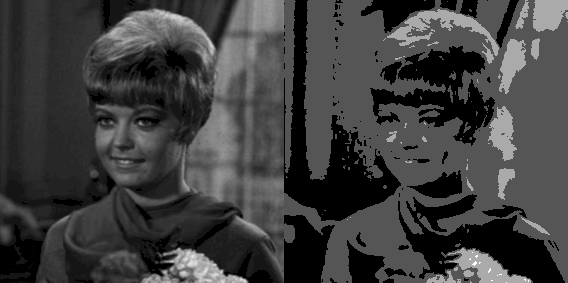

In [49]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Simulasi Image Depth')
print('--------------------')

# Set bit depth untuk simulasi
bit_depth = 2

# Path gambar
image_path = '/content/drive/MyDrive/PCVK/girl.png'

# Menghitung jumlah level warna yang tersedia berdasarkan bit depth
num_levels = 2**bit_depth
level_step = 255 / (num_levels - 1)

# Membaca gambar dalam mode grayscale
original_gray = cv.imread(image_path, cv.IMREAD_GRAYSCALE)

if original_gray is None:
    print(f"Error: Gambar tidak ditemukan di path '{image_path}'")
else:
    # Menginisialisasi matriks untuk gambar hasil
    depth_simulated = np.zeros_like(original_gray)
    rows, cols = original_gray.shape

    # Proses kuantisasi
    # Iterasi setiap piksel pada gambar
    for i in range(rows):
        for j in range(cols):
            # Normalisasi piksel ke rentang [0, num_levels - 1]
            quantized_val = np.round(original_gray[i, j] / level_step)

            # Kuantisasi piksel kembali ke rentang [0, 255]
            depth_simulated[i, j] = quantized_val * level_step

    # Menggabungkan gambar asli (grayscale) dan gambar hasil
    final_frame = cv.hconcat([original_gray, depth_simulated])

    # Menampilkan hasil
    cv2_imshow(final_frame)
    cv.waitKey(0)
    cv.destroyAllWindows()

3. Buat modul Average Denoising

**Average Denoising 10**

In [34]:
import cv2
import glob
import numpy as np
import os

# Ganti dengan jalur file yang sesuai
file_path = '/content/drive/MyDrive/PCVK/Images/'

# Periksa apakah folder noises ada
if not os.path.exists(file_path + 'noises/'):
    print("Error: Folder 'noises' tidak ditemukan pada jalur yang diberikan.")
    # Hentikan eksekusi program
    exit()

# Inisialisasi list untuk menyimpan citra
cv_img = []
# Menghitung jumlah citra
count = 0

# Loop untuk membaca semua citra dengan Gaussian Noise
for img in glob.glob(file_path + 'noises/*.jpg'):
    n = cv2.imread(img)
    if n is not None:
        n = np.float32(n)
        cv_img.append(n)
        count += 1
    else:
        print(f"Peringatan: Tidak dapat membaca file {img}")

    # Hentikan loop setelah 10 gambar berhasil dibaca
    if count == 10:
        break

# Periksa apakah ada gambar yang berhasil dibaca
if len(cv_img) == 0:
    print("Error: Tidak ada gambar yang ditemukan atau berhasil dibaca dari folder.")
else:
    # Inisialisasi array kosong untuk menampung total penjumlahan
    total_image = np.zeros_like(cv_img[0], dtype=np.float32)

    # Menjumlahkan semua citra
    for i in range(len(cv_img)):
        total_image = cv2.add(total_image, cv_img[i])

    # Menghitung rata-rata (average)
    average_image = total_image / count

    # Normalisasi dan konversi ke uint8
    average_image_normalized = cv2.normalize(average_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Membaca citra asli
    original_image = cv2.imread(file_path + 'galaxy.jpg')

    # Simpan hasil citra denoised
    cv2.imwrite('galaxy_denoised_10_images.jpg', average_image_normalized)

    # Simpan citra asli untuk perbandingan
    if original_image is not None:
        cv2.imwrite('galaxy_original.jpg', original_image)
        print("Citra asli disimpan sebagai galaxy_original.jpg")
    else:
        print("Peringatan: Tidak dapat membaca citra asli galaxy.jpg.")

    print(f"Proses denoising selesai. Hasil dari {count} gambar disimpan sebagai galaxy_denoised_10_images.jpg")

Citra asli disimpan sebagai galaxy_original.jpg
Proses denoising selesai. Hasil dari 10 gambar disimpan sebagai galaxy_denoised_10_images.jpg


**Average Denoising 20**

In [35]:
import cv2
import glob
import numpy as np
import os

# Tentukan jalur file yang sesuai
file_path = '/content/drive/MyDrive/PCVK/Images/'

# Periksa apakah folder noises ada
if not os.path.exists(file_path + 'noises/'):
    print("Error: Folder 'noises' tidak ditemukan pada jalur yang diberikan.")
    # Hentikan eksekusi program
    exit()

# Inisialisasi list untuk menyimpan citra
cv_img = []
# Menghitung jumlah citra
count = 0

# Loop untuk membaca semua citra dengan Gaussian Noise
for img in glob.glob(file_path + 'noises/*.jpg'):
    n = cv2.imread(img)
    if n is not None:
        n = np.float32(n)
        cv_img.append(n)
        count += 1
    else:
        print(f"Peringatan: Tidak dapat membaca file {img}")

    # Hentikan loop setelah 20 gambar berhasil dibaca
    if count == 20:
        break

# Periksa apakah ada gambar yang berhasil dibaca
if len(cv_img) == 0:
    print("Error: Tidak ada gambar yang ditemukan atau berhasil dibaca dari folder.")
else:
    # Inisialisasi array kosong untuk menampung total penjumlahan
    total_image = np.zeros_like(cv_img[0], dtype=np.float32)

    # Menjumlahkan semua citra
    for i in range(len(cv_img)):
        total_image = cv2.add(total_image, cv_img[i])

    # Menghitung rata-rata (average)
    average_image = total_image / count

    # Normalisasi dan konversi ke uint8
    average_image_normalized = cv2.normalize(average_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Membaca citra asli
    original_image = cv2.imread(file_path + 'galaxy.jpg')

    # Simpan hasil citra denoised
    cv2.imwrite('galaxy_denoised_20_images.jpg', average_image_normalized)

    # Simpan citra asli untuk perbandingan
    if original_image is not None:
        cv2.imwrite('galaxy_original.jpg', original_image)
        print("Citra asli disimpan sebagai galaxy_original.jpg")
    else:
        print("Peringatan: Tidak dapat membaca citra asli galaxy.jpg.")

    print(f"Proses denoising selesai. Hasil dari {count} gambar disimpan sebagai galaxy_denoised_20_images.jpg")

Citra asli disimpan sebagai galaxy_original.jpg
Proses denoising selesai. Hasil dari 20 gambar disimpan sebagai galaxy_denoised_20_images.jpg


**Average Denoising 40**

In [36]:
import cv2
import glob
import numpy as np
import os

# Tentukan jalur file yang sesuai
file_path = '/content/drive/MyDrive/PCVK/Images/'

# Periksa apakah folder noises ada
if not os.path.exists(file_path + 'noises/'):
    print("Error: Folder 'noises' tidak ditemukan pada jalur yang diberikan.")
    # Hentikan eksekusi program
    exit()

# Inisialisasi list untuk menyimpan citra
cv_img = []
# Menghitung jumlah citra
count = 0

# Loop untuk membaca semua citra dengan Gaussian Noise
for img in glob.glob(file_path + 'noises/*.jpg'):
    n = cv2.imread(img)
    if n is not None:
        n = np.float32(n)
        cv_img.append(n)
        count += 1
    else:
        print(f"Peringatan: Tidak dapat membaca file {img}")

    # Hentikan loop setelah 40 gambar berhasil dibaca
    if count == 40:
        break

# Periksa apakah ada gambar yang berhasil dibaca
if len(cv_img) == 0:
    print("Error: Tidak ada gambar yang ditemukan atau berhasil dibaca dari folder.")
else:
    # Inisialisasi array kosong untuk menampung total penjumlahan
    total_image = np.zeros_like(cv_img[0], dtype=np.float32)

    # Menjumlahkan semua citra
    for i in range(len(cv_img)):
        total_image = cv2.add(total_image, cv_img[i])

    # Menghitung rata-rata (average)
    average_image = total_image / count

    # Normalisasi dan konversi ke uint8
    average_image_normalized = cv2.normalize(average_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Membaca citra asli
    original_image = cv2.imread(file_path + 'galaxy.jpg')

    # Simpan hasil citra denoised
    cv2.imwrite('galaxy_denoised_40_images.jpg', average_image_normalized)

    # Simpan citra asli untuk perbandingan
    if original_image is not None:
        cv2.imwrite('galaxy_original.jpg', original_image)
        print("Citra asli disimpan sebagai galaxy_original.jpg")
    else:
        print("Peringatan: Tidak dapat membaca citra asli galaxy.jpg.")

    print(f"Proses denoising selesai. Hasil dari {count} gambar disimpan sebagai galaxy_denoised_40_images.jpg")

Citra asli disimpan sebagai galaxy_original.jpg
Proses denoising selesai. Hasil dari 40 gambar disimpan sebagai galaxy_denoised_40_images.jpg


**Average Denoising 80**

In [37]:
import cv2
import glob
import numpy as np
import os

# Tentukan jalur file yang sesuai
file_path = '/content/drive/MyDrive/PCVK/Images/'

# Periksa apakah folder noises ada
if not os.path.exists(file_path + 'noises/'):
    print("Error: Folder 'noises' tidak ditemukan pada jalur yang diberikan.")
    # Hentikan eksekusi program
    exit()

# Inisialisasi list untuk menyimpan citra
cv_img = []
# Menghitung jumlah citra
count = 0

# Loop untuk membaca semua citra dengan Gaussian Noise
for img in glob.glob(file_path + 'noises/*.jpg'):
    n = cv2.imread(img)
    if n is not None:
        n = np.float32(n)
        cv_img.append(n)
        count += 1
    else:
        print(f"Peringatan: Tidak dapat membaca file {img}")

    # Hentikan loop setelah 80 gambar berhasil dibaca
    if count == 80:
        break

# Periksa apakah ada gambar yang berhasil dibaca
if len(cv_img) == 0:
    print("Error: Tidak ada gambar yang ditemukan atau berhasil dibaca dari folder.")
else:
    # Inisialisasi array kosong untuk menampung total penjumlahan
    total_image = np.zeros_like(cv_img[0], dtype=np.float32)

    # Menjumlahkan semua citra
    for i in range(len(cv_img)):
        total_image = cv2.add(total_image, cv_img[i])

    # Menghitung rata-rata (average)
    average_image = total_image / count

    # Normalisasi dan konversi ke uint8
    average_image_normalized = cv2.normalize(average_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Membaca citra asli
    original_image = cv2.imread(file_path + 'galaxy.jpg')

    # Simpan hasil citra denoised
    cv2.imwrite('galaxy_denoised_80_images.jpg', average_image_normalized)

    # Simpan citra asli untuk perbandingan
    if original_image is not None:
        cv2.imwrite('galaxy_original.jpg', original_image)
        print("Citra asli disimpan sebagai galaxy_original.jpg")
    else:
        print("Peringatan: Tidak dapat membaca citra asli galaxy.jpg.")

    print(f"Proses denoising selesai. Hasil dari {count} gambar disimpan sebagai galaxy_denoised_80_images.jpg")

Citra asli disimpan sebagai galaxy_original.jpg
Proses denoising selesai. Hasil dari 80 gambar disimpan sebagai galaxy_denoised_80_images.jpg


**Average Denoising 100**

In [38]:
import cv2
import glob
import numpy as np
import os

# Tentukan jalur file yang sesuai
file_path = '/content/drive/MyDrive/PCVK/Images/'

# Periksa apakah folder noises ada
if not os.path.exists(file_path + 'noises/'):
    print("Error: Folder 'noises' tidak ditemukan pada jalur yang diberikan.")
    # Hentikan eksekusi program
    exit()

# Inisialisasi list untuk menyimpan citra
cv_img = []
# Menghitung jumlah citra
count = 0

# Loop untuk membaca semua citra dengan Gaussian Noise
for img in glob.glob(file_path + 'noises/*.jpg'):
    n = cv2.imread(img)
    if n is not None:
        n = np.float32(n)
        cv_img.append(n)
        count += 1
    else:
        print(f"Peringatan: Tidak dapat membaca file {img}")

    # Hentikan loop setelah 100 gambar berhasil dibaca
    if count == 100:
        break

# Periksa apakah ada gambar yang berhasil dibaca
if len(cv_img) == 0:
    print("Error: Tidak ada gambar yang ditemukan atau berhasil dibaca dari folder.")
else:
    # Inisialisasi array kosong untuk menampung total penjumlahan
    total_image = np.zeros_like(cv_img[0], dtype=np.float32)

    # Menjumlahkan semua citra
    for i in range(len(cv_img)):
        total_image = cv2.add(total_image, cv_img[i])

    # Menghitung rata-rata (average)
    average_image = total_image / count

    # Normalisasi dan konversi ke uint8
    average_image_normalized = cv2.normalize(average_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    # Membaca citra asli
    original_image = cv2.imread(file_path + 'galaxy.jpg')

    # Simpan hasil citra denoised
    cv2.imwrite('galaxy_denoised_100_images.jpg', average_image_normalized)

    # Simpan citra asli untuk perbandingan
    if original_image is not None:
        cv2.imwrite('galaxy_original.jpg', original_image)
        print("Citra asli disimpan sebagai galaxy_original.jpg")
    else:
        print("Peringatan: Tidak dapat membaca citra asli galaxy.jpg.")

    print(f"Proses denoising selesai. Hasil dari {count} gambar disimpan sebagai galaxy_denoised_100_images.jpg")

Citra asli disimpan sebagai galaxy_original.jpg
Proses denoising selesai. Hasil dari 100 gambar disimpan sebagai galaxy_denoised_100_images.jpg


**Hasil Foto Denoising dan Nilai PSNR (dB)**

--- Hasil Nilai PSNR ---
Jumlah Citra: 10, Nilai PSNR: 22.07 dB
Jumlah Citra: 20, Nilai PSNR: 24.22 dB
Jumlah Citra: 40, Nilai PSNR: 25.81 dB
Jumlah Citra: 80, Nilai PSNR: 27.85 dB
Jumlah Citra: 100, Nilai PSNR: 28.23 dB


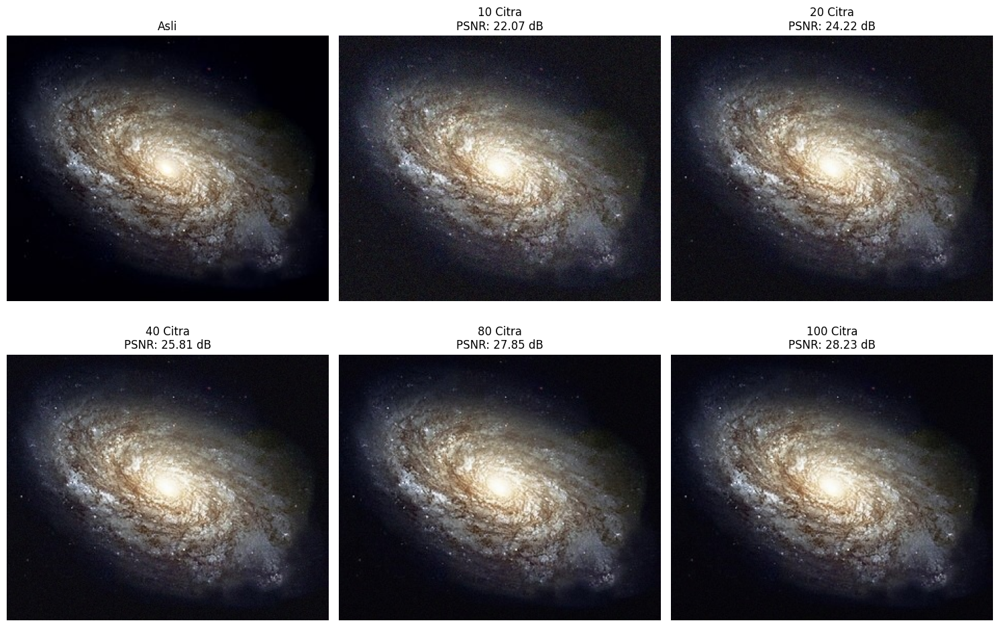

In [39]:
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

# Fungsi untuk menghitung nilai PSNR
def calculate_psnr(img1, img2):
    # Mengubah gambar ke tipe float32
    img1 = np.float32(img1)
    img2 = np.float32(img2)

    # Menghitung Mean Squared Error (MSE)
    mse = np.mean((img1 - img2) ** 2)

    # Jika MSE adalah 0, PSNR tidak terhingga (citra identik)
    if mse == 0:
        return float('inf')

    # Menghitung PSNR
    max_pixel = 255.0
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr

# --- Lakukan Pengaturan Jalur dan Pemrosesan ---
file_path = '/content/'  # Lokasi file di Google Colab, sesuaikan jika berbeda

# Memuat citra asli (ground truth)
original_image = cv2.imread(file_path + 'galaxy_original.jpg')
if original_image is None:
    print("Error: Foto asli 'galaxy_original.jpg' tidak ditemukan.")
else:
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB) # Ubah ke RGB untuk Matplotlib

    # Daftar file foto denoised yang akan dianalisis
    denoised_files = [
        'galaxy_denoised_10_images.jpg',
        'galaxy_denoised_20_images.jpg',
        'galaxy_denoised_40_images.jpg',
        'galaxy_denoised_80_images.jpg',
        'galaxy_denoised_100_images.jpg'
    ]

    print("--- Hasil Nilai PSNR ---")

    # Menyiapkan plot untuk menampilkan semua gambar
    plt.figure(figsize=(15, 10))

    # Menampilkan foto asli
    plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title('Asli')
    plt.axis('off')

    # Memproses setiap foto denoised
    for i, filename in enumerate(denoised_files):
        denoised_image = cv2.imread(file_path + filename)

        if denoised_image is not None:
            # Ubah ke RGB untuk Matplotlib
            denoised_image = cv2.cvtColor(denoised_image, cv2.COLOR_BGR2RGB)

            # Hitung PSNR
            psnr_val = calculate_psnr(original_image, denoised_image)

            # Dapatkan jumlah citra dari nama file
            num_images = filename.split('_')[2]

            # Cetak nilai PSNR
            print(f"Jumlah Citra: {num_images}, Nilai PSNR: {psnr_val:.2f} dB")

            # Tampilkan foto di plot
            plt.subplot(2, 3, i + 2)
            plt.imshow(denoised_image)
            plt.title(f'{num_images} Citra\nPSNR: {psnr_val:.2f} dB')
            plt.axis('off')

    plt.tight_layout()
    plt.show()

4. Buat image masking

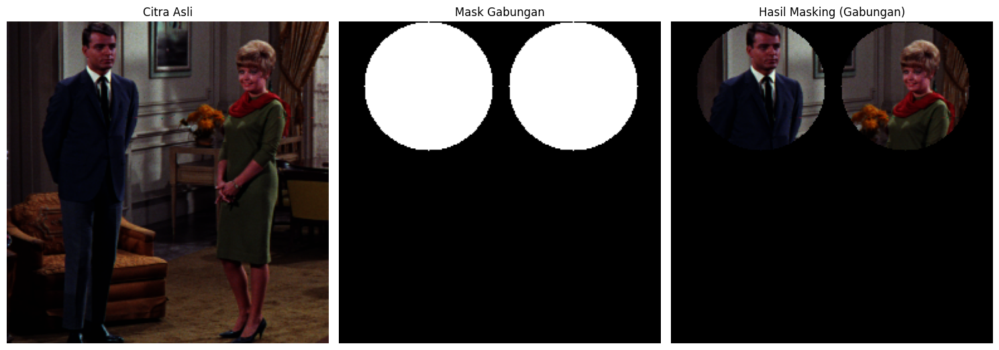

Hasil masking gabungan telah disimpan sebagai 'couple_masked_combined.jpg'.


In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Pengaturan Jalur File ---
file_path = '/content/drive/MyDrive/PCVK/Images/'
image_name = 'couple.tiff'

# --- 2. Memuat Citra Asli ---
original_image = cv2.imread(file_path + image_name)

if original_image is None:
    print(f"Error: Citra '{image_name}' tidak ditemukan di {file_path}. Pastikan jalur dan nama file benar.")
else:
    # Konversi dari BGR ke RGB untuk tampilan Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Dapatkan dimensi citra
    height, width, _ = original_image.shape

    # --- 3. Membuat Masking ---

    # Ukuran mask (sesuaikan jika diperlukan)
    mask_height = height
    mask_width = width

    # Mask untuk lingkaran pertama (pria)
    mask1 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    # Sesuaikan koordinat Y untuk menaikkan posisi
    center1_x, center1_y = int(width * 0.28), int(height * 0.2)
    radius1 = int(height * 0.2)
    cv2.circle(mask1, (center1_x, center1_y), radius1, (255), -1)

    # Mask untuk lingkaran kedua (wanita)
    mask2 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    # Sesuaikan koordinat X, Y dan radius agar sesuai dengan wajah di gambar Anda
    center2_x, center2_y = int(width * 0.73), int(height * 0.2)
    radius2 = int(height * 0.2)
    cv2.circle(mask2, (center2_x, center2_y), radius2, (255), -1)

    # Gabungkan kedua mask untuk tampilan
    combined_mask_display = cv2.bitwise_or(mask1, mask2)

    # --- 4. Menerapkan Masking dan Menggabungkannya dalam Satu Frame ---

    # Buat mask gabungan untuk diterapkan langsung ke citra asli
    combined_mask_for_image = cv2.bitwise_or(mask1, mask2)
    combined_masked_result = cv2.bitwise_and(original_image_rgb, original_image_rgb, mask=combined_mask_for_image)

    # --- 5. Menampilkan Hasil ---
    plt.figure(figsize=(15, 8))

    # Tampilkan Citra Asli
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_rgb)
    plt.title('Citra Asli')
    plt.axis('off')

    # Tampilkan Gabungan Mask (hitam dengan dua lingkaran putih)
    plt.subplot(1, 3, 2)
    plt.imshow(combined_mask_display, cmap='gray')
    plt.title('Mask Gabungan')
    plt.axis('off')

    # Tampilkan Hasil Masking Gabungan dalam Satu Frame
    plt.subplot(1, 3, 3)
    plt.imshow(combined_masked_result)
    plt.title('Hasil Masking (Gabungan)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Opsional: Simpan hasil masking gabungan
    cv2.imwrite('couple_masked_combined.jpg', cv2.cvtColor(combined_masked_result, cv2.COLOR_RGB2BGR))
    print("Hasil masking gabungan telah disimpan sebagai 'couple_masked_combined.jpg'.")

**Operator NOT (komplemen)**

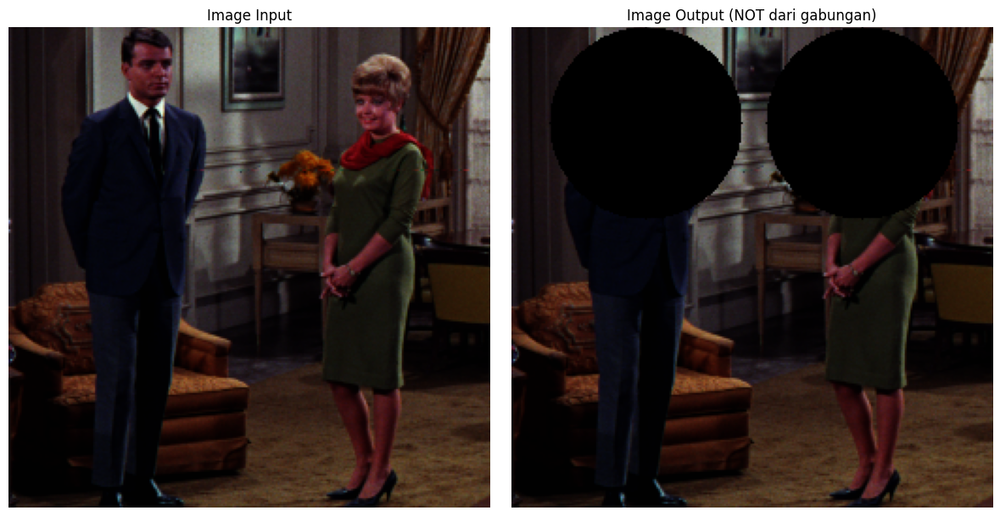

Hasil output telah disimpan sebagai 'couple_not_combined.jpg' di Colab Files.


In [41]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Pengaturan Jalur File ---
file_path = '/content/drive/MyDrive/PCVK/Images/'
image_name = 'couple.tiff'

# --- 2. Memuat Citra Asli ---
original_image = cv2.imread(file_path + image_name)

if original_image is None:
    print(f"Error: Citra '{image_name}' tidak ditemukan di {file_path}. Pastikan jalur dan nama file benar.")
else:
    # Konversi dari BGR ke RGB untuk tampilan Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Dapatkan dimensi citra
    height, width, _ = original_image.shape

    # --- 3. Membuat Masking untuk Pria dan Wanita ---
    mask_height = height
    mask_width = width

    # Mask untuk lingkaran pertama (pria)
    mask1 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center1_x, center1_y = int(width * 0.28), int(height * 0.2)
    radius1 = int(height * 0.2)
    cv2.circle(mask1, (center1_x, center1_y), radius1, (255), -1)

    # Mask untuk lingkaran kedua (wanita)
    mask2 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center2_x, center2_y = int(width * 0.73), int(height * 0.2)
    radius2 = int(height * 0.2)
    cv2.circle(mask2, (center2_x, center2_y), radius2, (255), -1)

    # Menggabungkan kedua mask dengan operasi OR
    combined_mask = cv2.bitwise_or(mask1, mask2)

    # --- 4. Menggunakan Operator NOT (Komplemen) pada Gabungan Mask ---
    # Melakukan operasi NOT pada gabungan mask
    mask_not = cv2.bitwise_not(combined_mask)

    # Menerapkan mask yang sudah di-NOT ke citra asli
    result_not = cv2.bitwise_and(original_image_rgb, original_image_rgb, mask=mask_not)

    # --- 5. Menampilkan Hasil ---
    plt.figure(figsize=(12, 6))

    # Tampilkan Citra Input (Citra Asli)
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title('Image Input')
    plt.axis('off')

    # Tampilkan Citra Output (Hasil Operasi NOT)
    plt.subplot(1, 2, 2)
    plt.imshow(result_not)
    plt.title('Image Output (NOT dari gabungan)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 6. Menyimpan Hasil Output ---
    cv2.imwrite('couple_not_combined.jpg', cv2.cvtColor(result_not, cv2.COLOR_RGB2BGR))
    print("Hasil output telah disimpan sebagai 'couple_not_combined.jpg' di Colab Files.")

Operator OR (Atau)

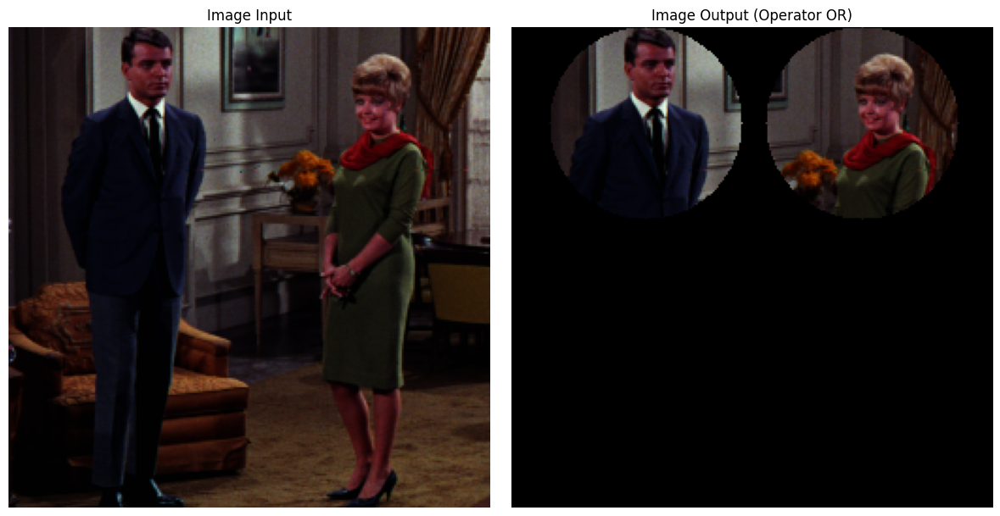

Hasil output telah disimpan sebagai 'couple_or.jpg' di Colab Files.


In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Pengaturan Jalur File ---
file_path = '/content/drive/MyDrive/PCVK/Images/'
image_name = 'couple.tiff'

# --- 2. Memuat Citra Asli ---
original_image = cv2.imread(file_path + image_name)

if original_image is None:
    print(f"Error: Citra '{image_name}' tidak ditemukan di {file_path}. Pastikan jalur dan nama file benar.")
else:
    # Konversi dari BGR ke RGB untuk tampilan Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Dapatkan dimensi citra
    height, width, _ = original_image.shape

    # --- 3. Membuat Masking untuk Pria dan Wanita ---
    mask_height = height
    mask_width = width

    # Mask untuk lingkaran pertama (pria)
    mask1 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center1_x, center1_y = int(width * 0.28), int(height * 0.2)
    radius1 = int(height * 0.2)
    cv2.circle(mask1, (center1_x, center1_y), radius1, (255), -1)

    # Mask untuk lingkaran kedua (wanita)
    mask2 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center2_x, center2_y = int(width * 0.73), int(height * 0.2)
    radius2 = int(height * 0.2)
    cv2.circle(mask2, (center2_x, center2_y), radius2, (255), -1)

    # --- 4. Menggunakan Operator OR (Atau) untuk Menggabungkan Mask ---
    # Menggabungkan kedua mask dengan operasi OR
    combined_mask_or = cv2.bitwise_or(mask1, mask2)

    # Menerapkan mask gabungan ke citra asli
    result_or = cv2.bitwise_and(original_image_rgb, original_image_rgb, mask=combined_mask_or)

    # --- 5. Menampilkan Hasil ---
    plt.figure(figsize=(12, 6))

    # Tampilkan Citra Input (Citra Asli)
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title('Image Input')
    plt.axis('off')

    # Tampilkan Citra Output (Hasil Operasi OR)
    plt.subplot(1, 2, 2)
    plt.imshow(result_or)
    plt.title('Image Output (Operator OR)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 6. Menyimpan Hasil Output ---
    cv2.imwrite('couple_or.jpg', cv2.cvtColor(result_or, cv2.COLOR_RGB2BGR))
    print("Hasil output telah disimpan sebagai 'couple_or.jpg' di Colab Files.")

Operator AND (Dan)

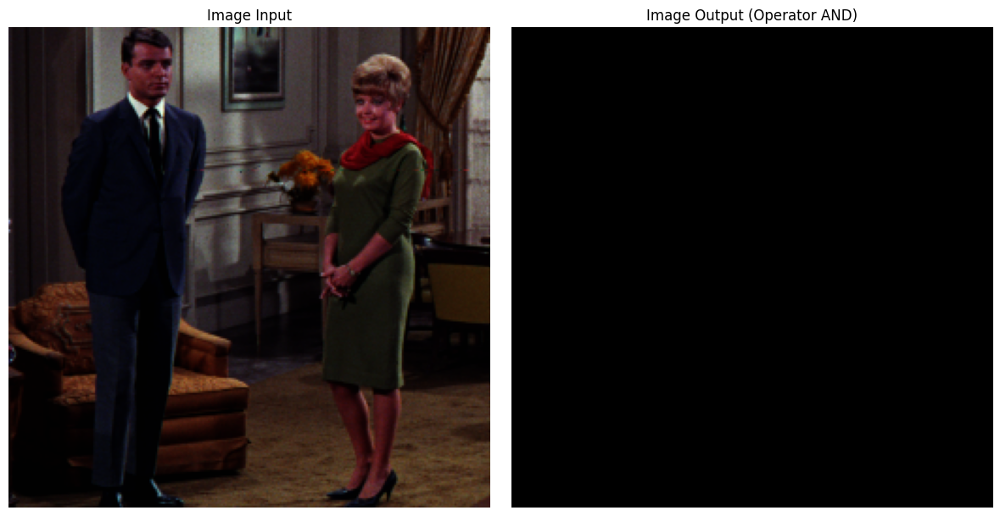

Hasil output telah disimpan sebagai 'couple_and.jpg' di Colab Files.


In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Pengaturan Jalur File ---
file_path = '/content/drive/MyDrive/PCVK/Images/'
image_name = 'couple.tiff'

# --- 2. Memuat Citra Asli ---
original_image = cv2.imread(file_path + image_name)

if original_image is None:
    print(f"Error: Citra '{image_name}' tidak ditemukan di {file_path}. Pastikan jalur dan nama file benar.")
else:
    # Konversi dari BGR ke RGB untuk tampilan Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Dapatkan dimensi citra
    height, width, _ = original_image.shape

    # --- 3. Membuat Masking untuk Pria dan Wanita ---
    mask_height = height
    mask_width = width

    # Mask untuk lingkaran pertama (pria)
    mask1 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center1_x, center1_y = int(width * 0.28), int(height * 0.2)
    radius1 = int(height * 0.2)
    cv2.circle(mask1, (center1_x, center1_y), radius1, (255), -1)

    # Mask untuk lingkaran kedua (wanita)
    mask2 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center2_x, center2_y = int(width * 0.73), int(height * 0.2)
    radius2 = int(height * 0.2)
    cv2.circle(mask2, (center2_x, center2_y), radius2, (255), -1)

    # --- 4. Menggunakan Operator AND (Dan) ---
    # Melakukan operasi AND pada mask1 dan mask2
    result_and_mask = cv2.bitwise_and(mask1, mask2)

    # Menerapkan mask hasil AND ke citra asli
    result_and_image = cv2.bitwise_and(original_image_rgb, original_image_rgb, mask=result_and_mask)

    # --- 5. Menampilkan Hasil ---
    plt.figure(figsize=(12, 6))

    # Tampilkan Citra Input (Citra Asli)
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title('Image Input')
    plt.axis('off')

    # Tampilkan Citra Output (Hasil Operasi AND)
    plt.subplot(1, 2, 2)
    plt.imshow(result_and_image)
    plt.title('Image Output (Operator AND)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 6. Menyimpan Hasil Output ---
    cv2.imwrite('couple_and.jpg', cv2.cvtColor(result_and_image, cv2.COLOR_RGB2BGR))
    print("Hasil output telah disimpan sebagai 'couple_and.jpg' di Colab Files.")

Operator NAND (Not And)

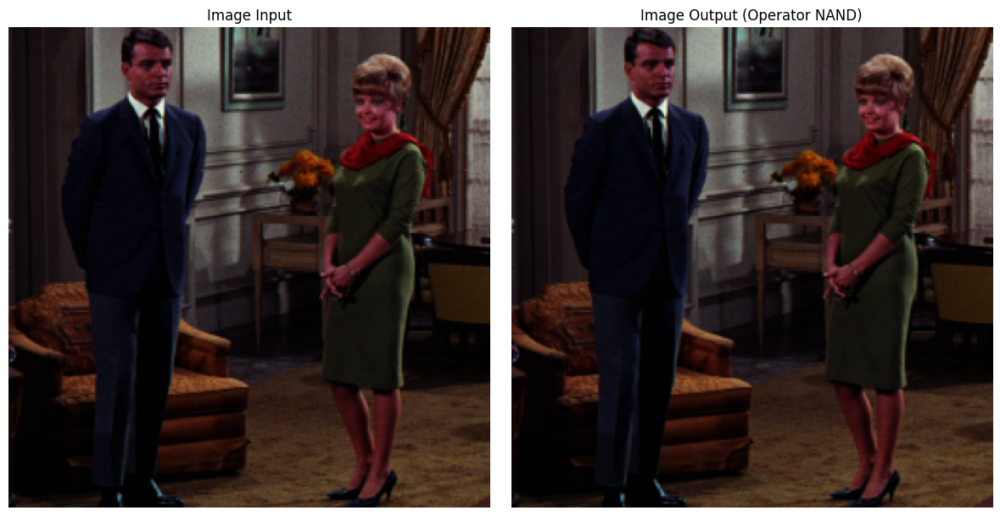

Hasil output telah disimpan sebagai 'couple_nand.jpg' di Colab Files.


In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Pengaturan Jalur File ---
file_path = '/content/drive/MyDrive/PCVK/Images/'
image_name = 'couple.tiff'

# --- 2. Memuat Citra Asli ---
original_image = cv2.imread(file_path + image_name)

if original_image is None:
    print(f"Error: Citra '{image_name}' tidak ditemukan di {file_path}. Pastikan jalur dan nama file benar.")
else:
    # Konversi dari BGR ke RGB untuk tampilan Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Dapatkan dimensi citra
    height, width, _ = original_image.shape

    # --- 3. Membuat Masking untuk Pria dan Wanita ---
    mask_height = height
    mask_width = width

    # Mask untuk lingkaran pertama (pria)
    mask1 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center1_x, center1_y = int(width * 0.28), int(height * 0.2)
    radius1 = int(height * 0.2)
    cv2.circle(mask1, (center1_x, center1_y), radius1, (255), -1)

    # Mask untuk lingkaran kedua (wanita)
    mask2 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center2_x, center2_y = int(width * 0.73), int(height * 0.2)
    radius2 = int(height * 0.2)
    cv2.circle(mask2, (center2_x, center2_y), radius2, (255), -1)

    # --- 4. Menggunakan Operator NAND (Not And) ---
    # Langkah 1: Operasi AND pada kedua mask
    and_mask = cv2.bitwise_and(mask1, mask2)

    # Langkah 2: Operasi NOT pada hasil AND
    nand_mask = cv2.bitwise_not(and_mask)

    # Menerapkan mask hasil NAND ke citra asli
    result_nand = cv2.bitwise_and(original_image_rgb, original_image_rgb, mask=nand_mask)

    # --- 5. Menampilkan Hasil ---
    plt.figure(figsize=(12, 6))

    # Tampilkan Citra Input (Citra Asli)
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title('Image Input')
    plt.axis('off')

    # Tampilkan Citra Output (Hasil Operasi NAND)
    plt.subplot(1, 2, 2)
    plt.imshow(result_nand)
    plt.title('Image Output (Operator NAND)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 6. Menyimpan Hasil Output ---
    cv2.imwrite('couple_nand.jpg', cv2.cvtColor(result_nand, cv2.COLOR_RGB2BGR))
    print("Hasil output telah disimpan sebagai 'couple_nand.jpg' di Colab Files.")

Operator XOR (Exlusive Or)

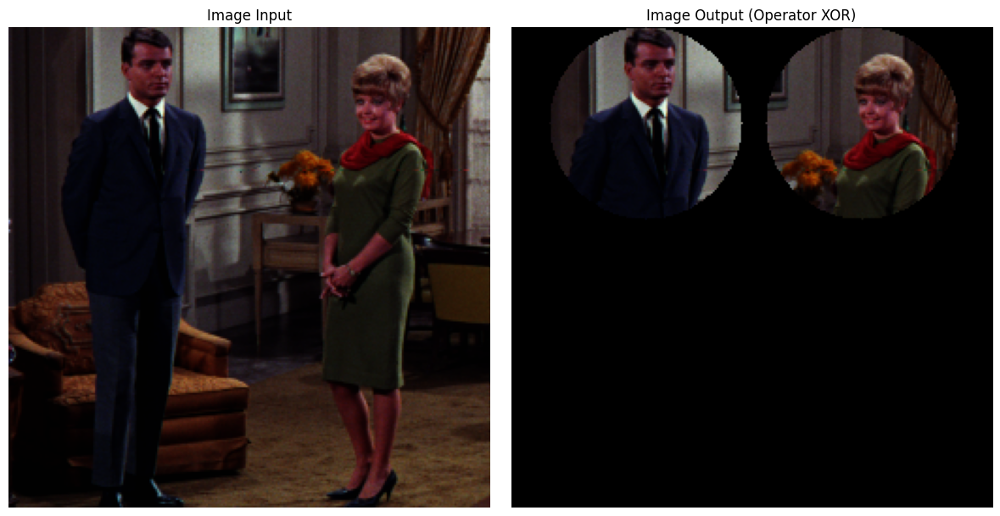

Hasil output telah disimpan sebagai 'couple_xor.jpg' di Colab Files.


In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- 1. Pengaturan Jalur File ---
file_path = '/content/drive/MyDrive/PCVK/Images/'
image_name = 'couple.tiff'

# --- 2. Memuat Citra Asli ---
original_image = cv2.imread(file_path + image_name)

if original_image is None:
    print(f"Error: Citra '{image_name}' tidak ditemukan di {file_path}. Pastikan jalur dan nama file benar.")
else:
    # Konversi dari BGR ke RGB untuk tampilan Matplotlib
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    # Dapatkan dimensi citra
    height, width, _ = original_image.shape

    # --- 3. Membuat Masking untuk Pria dan Wanita ---
    mask_height = height
    mask_width = width

    # Mask untuk lingkaran pertama (pria)
    mask1 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center1_x, center1_y = int(width * 0.28), int(height * 0.2)
    radius1 = int(height * 0.2)
    cv2.circle(mask1, (center1_x, center1_y), radius1, (255), -1)

    # Mask untuk lingkaran kedua (wanita)
    mask2 = np.zeros((mask_height, mask_width), dtype=np.uint8)
    center2_x, center2_y = int(width * 0.73), int(height * 0.2)
    radius2 = int(height * 0.2)
    cv2.circle(mask2, (center2_x, center2_y), radius2, (255), -1)

    # --- 4. Menggunakan Operator XOR (Exclusive Or) ---
    # Melakukan operasi XOR pada mask1 dan mask2
    result_xor_mask = cv2.bitwise_xor(mask1, mask2)

    # Menerapkan mask hasil XOR ke citra asli
    result_xor_image = cv2.bitwise_and(original_image_rgb, original_image_rgb, mask=result_xor_mask)

    # --- 5. Menampilkan Hasil ---
    plt.figure(figsize=(12, 6))

    # Tampilkan Citra Input (Citra Asli)
    plt.subplot(1, 2, 1)
    plt.imshow(original_image_rgb)
    plt.title('Image Input')
    plt.axis('off')

    # Tampilkan Citra Output (Hasil Operasi XOR)
    plt.subplot(1, 2, 2)
    plt.imshow(result_xor_image)
    plt.title('Image Output (Operator XOR)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # --- 6. Menyimpan Hasil Output ---
    cv2.imwrite('couple_xor.jpg', cv2.cvtColor(result_xor_image, cv2.COLOR_RGB2BGR))
    print("Hasil output telah disimpan sebagai 'couple_xor.jpg' di Colab Files.")